<h1><center> SAM inference on our dataset

In [2]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2
from PIL import Image
import numpy as np
import rasterio
import os

# Loading SAM

In [4]:
n_image = 9

In [5]:
checkpoint_path = '../checkpoint/sam_vit_h_4b8939.pth'
sat_dir = '../part1/' + str(n_image) 
path_image = 'sentinel12_s2_' + str(n_image) +'_img.tif'
path_mask = 'sentinel12_s2_' + str(n_image) +'_msk.tif'

In [6]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [7]:
# load sam
import sys
sys.path.append("..")
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

model_type = "vit_h"

sam = sam_model_registry[model_type](checkpoint=checkpoint_path)
sam.to(device=device)

mask_generator = SamAutomaticMaskGenerator(sam)

/Users/emmagauillard/Documents/MVA/Remote_sensing/projet/projet_remote/env/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [8]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)
    
def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)   
    
def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))

# 1-  Preprocess data

## a- Read image 

In [9]:
def read_rasterio(fp):
    img = rasterio.open(fp)
    return img
    
def read_tif_image(tif_path):
    img = Image.open(tif_path)
    img = np.array(img)
    return img

In [10]:
def simple_equalization_8bit(im, percentiles=5):
    ''' im is a numpy array
        returns a numpy array
    '''
    out = np.zeros_like(im)
    # faire l'equalization par channel
    def equalize(im_channel):
        v_min, v_max = np.percentile(im_channel,percentiles),np.percentile(im_channel, 100 - percentiles)

        # Clip the image to the percentile values
        im_clipped = np.clip(im_channel, v_min, v_max)

        # Scale the image to the 0-255 range
        im_scaled = np.round((im_clipped - v_min)*255 / (v_max - v_min))
        return im_scaled.astype(np.uint8)
    
    for channel in range(im.shape[2]):
        out[:,:,channel] = equalize(im[:,:,channel])
    
    return out

In [11]:
img = read_rasterio(os.path.join(sat_dir, path_image))
img_array = img.read()
img_array = np.moveaxis(img_array, 0, -1)

# plot image to see what it looks like
rgb_channel = img_array[:,:,0:3]
rgb_channel =  simple_equalization_8bit(rgb_channel, percentiles=10)

gt = read_rasterio(os.path.join(sat_dir, path_mask))
gt_array = gt.read()[0]

# save mask 

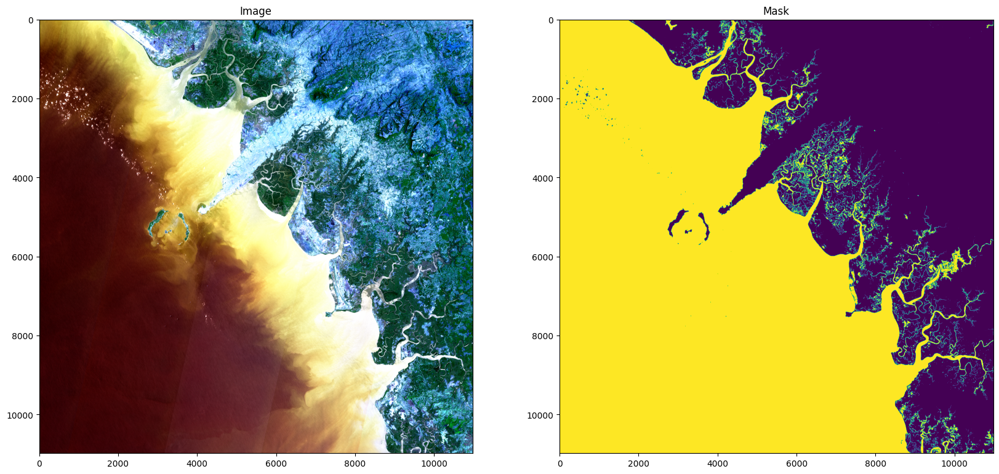

In [12]:
#plot image and mask on the same figure 
fig, ax = plt.subplots(1, 2, figsize=(20, 10))
ax[0].imshow(rgb_channel)
ax[1].imshow(gt_array)
ax[0].set_title('Image')
ax[1].set_title('Mask')
plt.show()


## b- Choose your area of interest

In [13]:
# aoi = (slice(500, 2500), slice(3500, 5500))
# aoi = (slice(2000, 6000), slice(4000, 8500))
aoi = (slice(0,2000), slice(3000,5000))
# aoi = (slice(None), slice(None))

In [14]:
crop = img_array[aoi[0], aoi[1],:]
gt_crop = gt_array[aoi[0], aoi[1]]
print(crop.shape)

(2000, 2000, 6)


In [15]:
# resized_crop = cv2.resize(crop, (1000, 1000))
resized_crop = crop
rgb_resized_crop = crop[:,:,0:3]
rgb_resized_crop =  simple_equalization_8bit(rgb_resized_crop, percentiles=10)

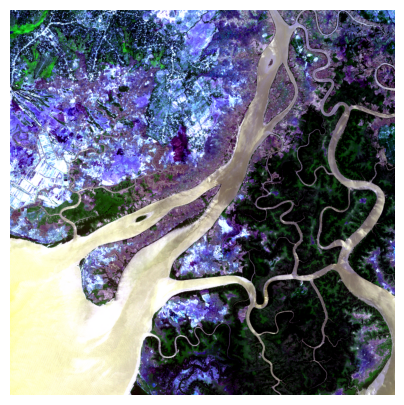

In [18]:
plt.figure(figsize=(5,5))
plt.imshow(rgb_resized_crop)
# save the image
plt.axis('off')
plt.show()
plt.close()

### c- NDWI 

The Normalized Difference Vegetation Index (NDVI) is a standard measure used to gauge the density and health of vegetation from satellite imagery. It's calculated from the reflectance measures in the red and near-infrared (NIR) bands of the electromagnetic spectrum.



In [19]:
import random
from skimage.morphology import binary_opening, binary_closing, disk

def calculate_ndwi(img):
    # Extract bands
    green_band = img[:,:,1]
    nir_band = img[:,:,3]
    
    ndwi = (nir_band.astype(float) - green_band.astype(float)) / (nir_band + green_band)
    ndwi = np.nan_to_num(ndwi, nan=0.0)

    return ndwi

def calculate_ndwi_2(img):
    swir_band = img[:,:,4]
    nir_band = img[:,:,3]
    
    ndwi = (nir_band.astype(float) - swir_band.astype(float)) / (nir_band + swir_band)
    ndwi = np.nan_to_num(ndwi, nan=0.0)
    return ndwi

def apply_morphological_operations(mask):
    mask = binary_opening(mask, disk(2))
    mask = binary_closing(mask, disk(2))
    return mask

def prompt_points(image, window_size=100):
        
    # Obtenir les dimensions de l'image
    height, width = image.shape
    
    # Préparer une liste pour stocker les points et leurs labels
    points_and_labels = []
    
    # Découper l'image en grilles
    for i in range(0, height, window_size):
        for j in range(0, width, window_size):
            window = image[i:i+window_size, j:j+window_size]
            
            unique, counts = np.unique(window, return_counts=True)
            window_class_counts = dict(zip(unique, counts))
            
            major_class = max(window_class_counts, key=window_class_counts.get)
            
            indices = np.argwhere(window == major_class)
            
            # Choisir un point aléatoire parmi ceux de la classe majoritaire
            if indices.size > 0:
                random_index = random.choice(indices)
                point = (j + random_index[1], i + random_index[0])  # (x, y)
                points_and_labels.append((point, major_class))
    
    return points_and_labels


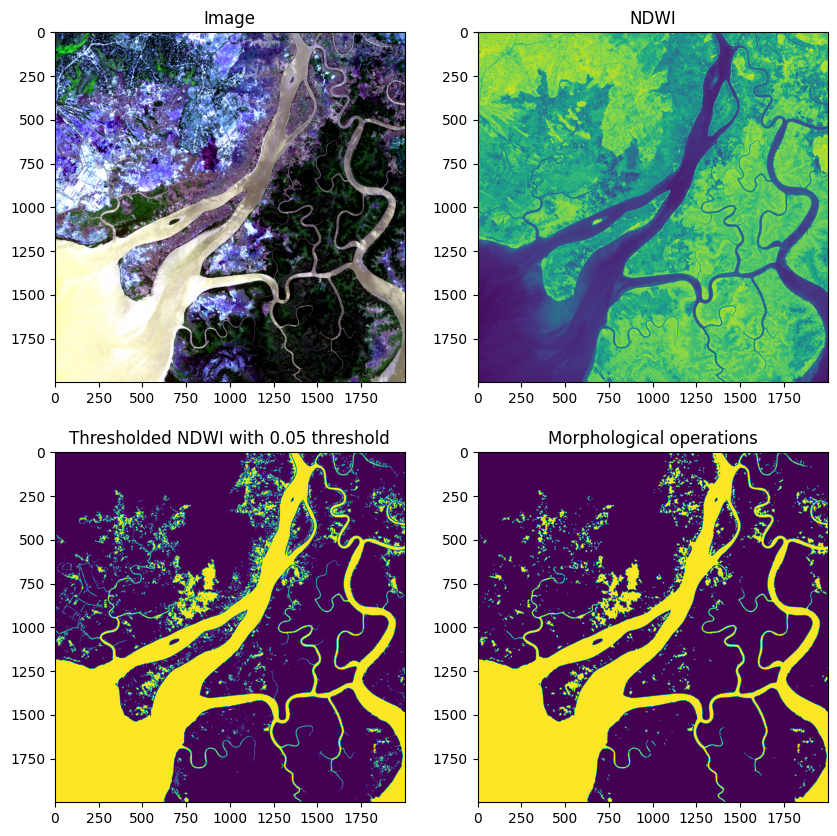

In [20]:
ndwi = calculate_ndwi(resized_crop)
threshold = 0.05
thresholded = ndwi < threshold
morpho = apply_morphological_operations(thresholded)
fig, ax = plt.subplots(2, 2, figsize=(10, 10))
ax[0,0].imshow(rgb_resized_crop)
ax[0,0].set_title('Image')
ax[0,1].imshow(ndwi)
ax[0,1].set_title('NDWI')
ax[1,0].imshow(thresholded)
ax[1,0].set_title(f'Thresholded NDWI with {threshold} threshold')
ax[1,1].imshow(morpho)
ax[1,1].set_title('Morphological operations')
plt.show()



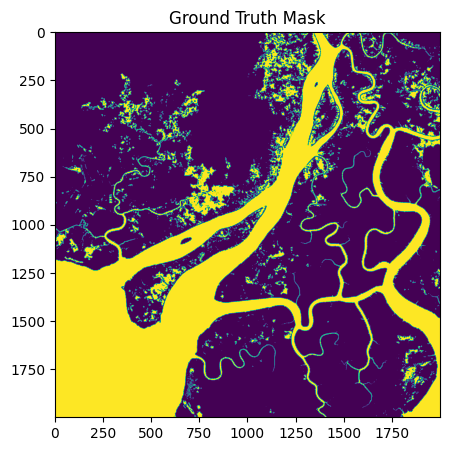

In [21]:
plt.figure(figsize=(5,5))
plt.imshow(gt_crop)
plt.title('Ground Truth Mask')
plt.show()

In [22]:
# save numpy array as tif
os.makedirs('../images', exist_ok=True)
def save_tif_image(tif_path, img):
    img = Image.fromarray(img)
    img.save(tif_path)
    
mask = morpho.astype(np.uint8)
save_tif_image(f'../images/ndwi_{n_image}.tif', morpho)

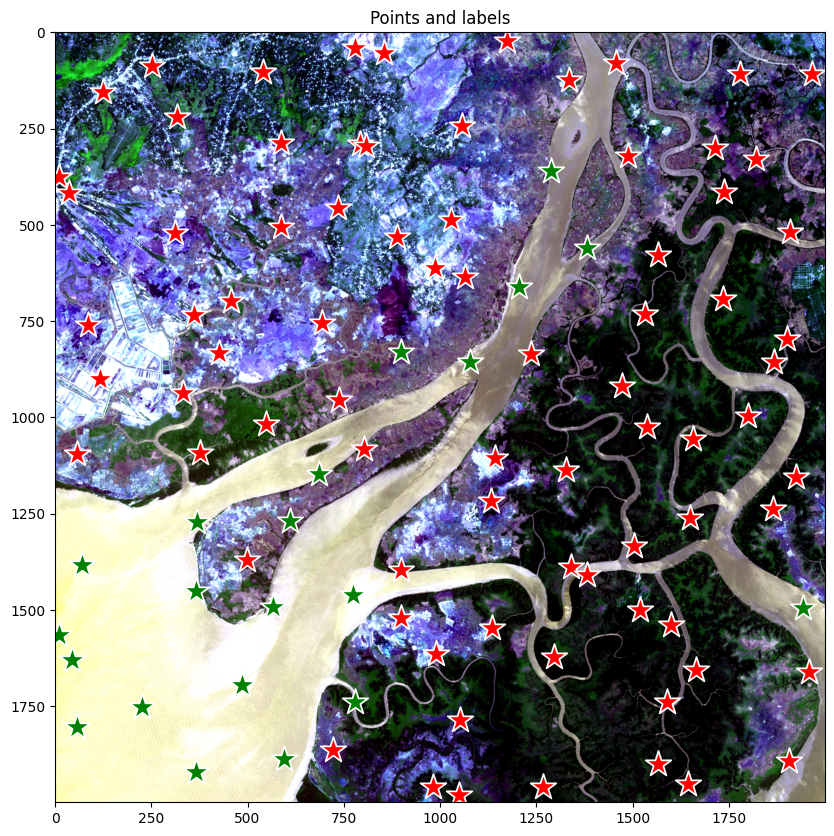

In [23]:
points_labels = prompt_points(morpho, window_size=200)
points = [point for point, label in points_labels]
labels = [label for point, label in points_labels]


input_point = np.array(points)
input_label = np.array(labels)
plt.figure(figsize=(10,10))
plt.imshow(rgb_resized_crop)
show_points(input_point, input_label, plt.gca())
plt.title('Points and labels')
plt.axis('on')
plt.show() 

# 2- Mask predictor

In [24]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2

In [25]:
import sys
sys.path.append("..")
from segment_anything import sam_model_registry, SamPredictor
predictor = SamPredictor(sam)

In [26]:
input = rgb_resized_crop.astype(np.float32)

In [ ]:
predictor.set_image(input)

In [ ]:
input_point = np.array(points)
input_label = np.array(labels)

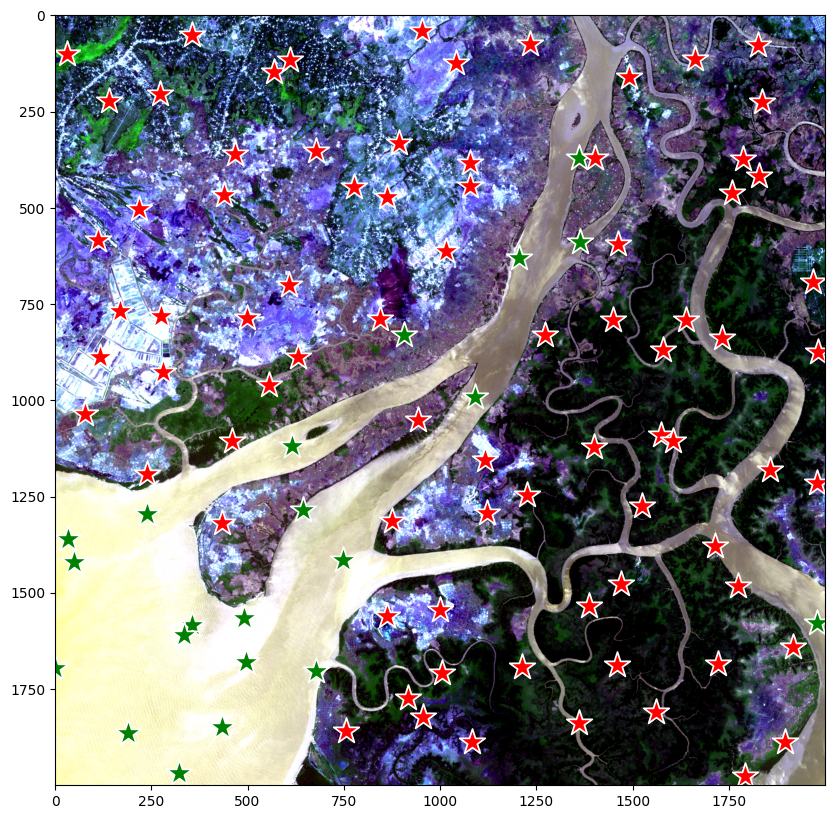

In [ ]:
plt.figure(figsize=(10,10))
plt.imshow(rgb_resized_crop)
show_points(input_point, input_label, plt.gca())
plt.axis('on')
plt.show() 

In [ ]:
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=True,
)

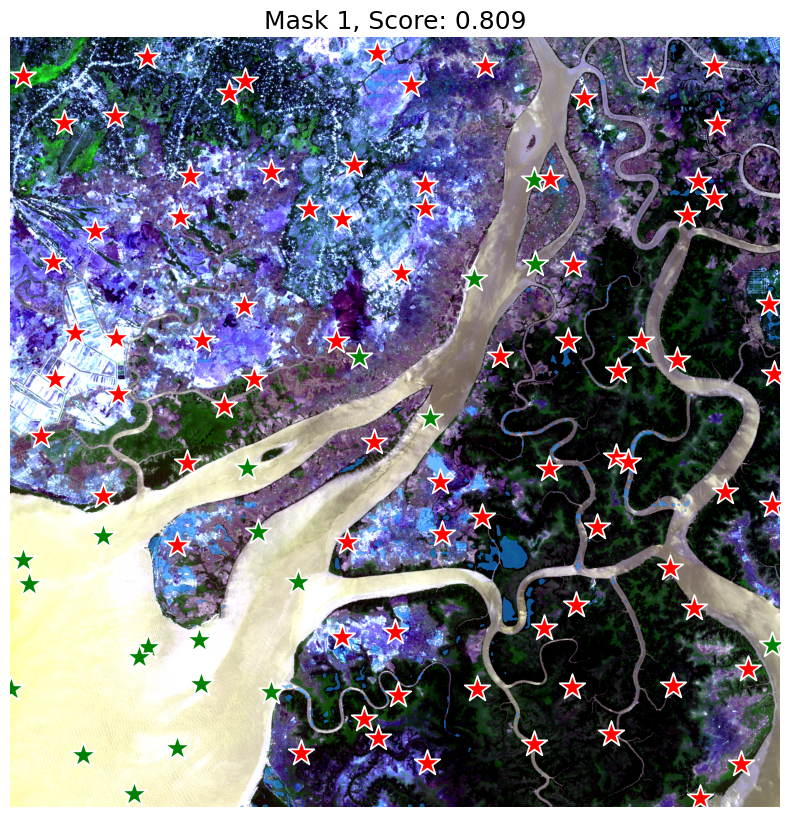

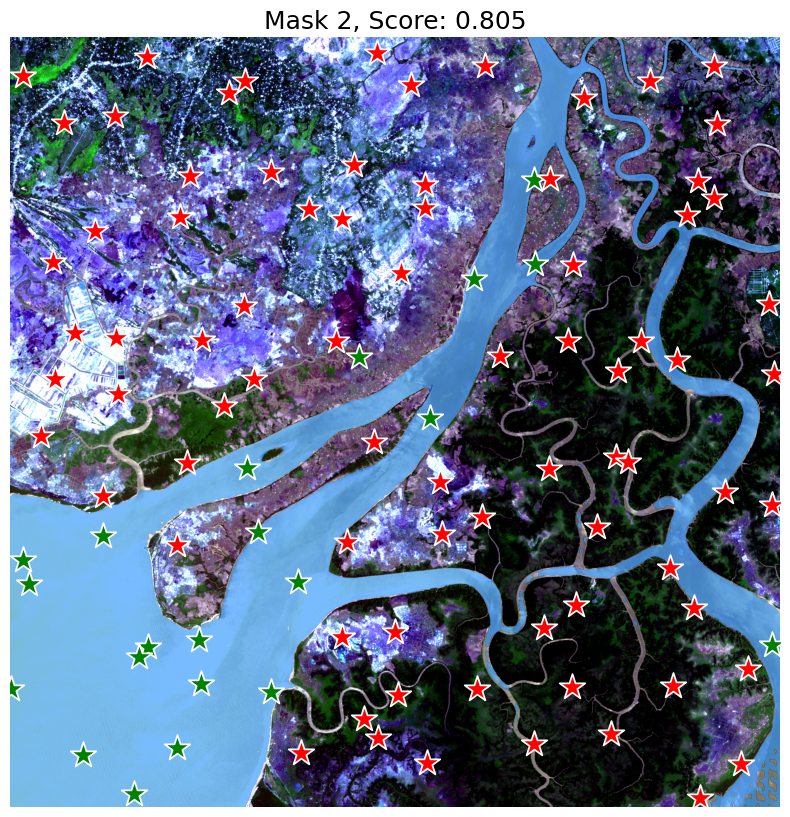

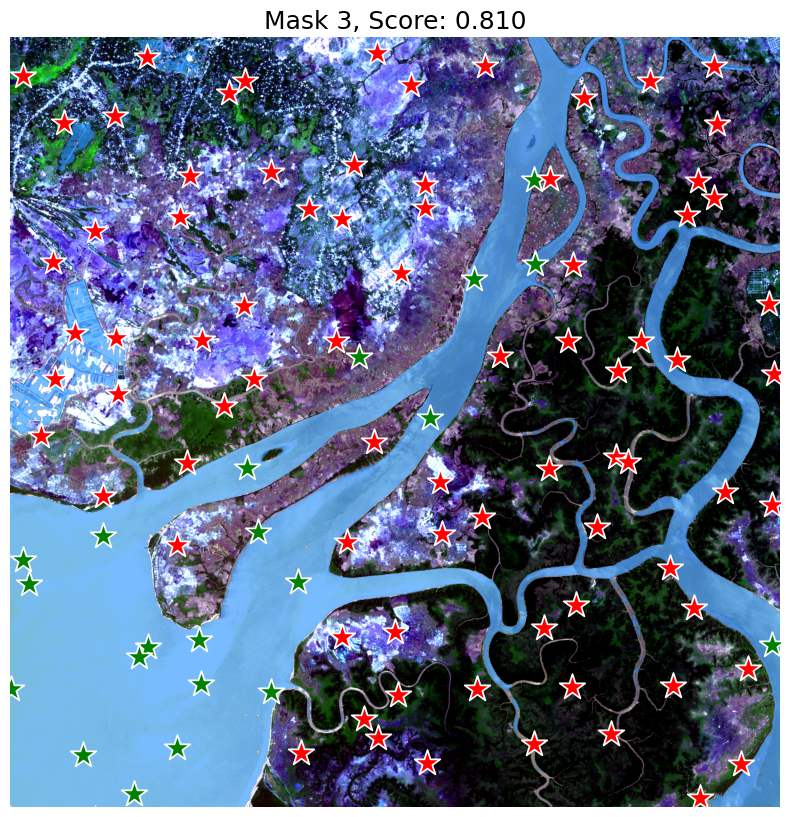

In [ ]:
for i, (mask, score) in enumerate(zip(masks, scores)):
    plt.figure(figsize=(10,10))
    plt.imshow(rgb_resized_crop)
    show_points(input_point, input_label, plt.gca())
    show_mask(mask, plt.gca())
    plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
    plt.axis('off')
    plt.show()  
  

# 3- Predict it for the whole image 

## A- Prediction per patches

In [29]:
import tqdm

def predict_mask(crop, predictor,window_size=300):
    # Calculate NDWI
    ndwi = calculate_ndwi(crop)
    
    # Threshold NDWI
    threshold = 0.05
    thresholded = ndwi < threshold
    
    # Apply morphological operations
    thresholded = apply_morphological_operations(thresholded)
    # save numpy array as tif
    save_tif_image(f'../masks/ndwi_{n_image}.tif', thresholded)
    
    
    # Prompt points
    points_labels = prompt_points(thresholded, window_size=window_size)
    points = [point for point, label in points_labels]
    labels = [label for point, label in points_labels]
    
    # Predict masks
    input_point = np.array(points)
    input_label = np.array(labels)
    
    rgb_crop = crop[:,:,0:3]
    rgb_crop =  simple_equalization_8bit(rgb_crop, percentiles=10).astype(np.float32)
    
    predictor.set_image(rgb_crop)
    masks, scores, logits = predictor.predict(
        point_coords=input_point,
        point_labels=input_label,
        multimask_output=True,
    )
    return masks, scores, points_labels, logits



def predict_all_masks(img_array, predictor, crop_size=3000, window_size=300):
    crop_data = []
    h, w, _ = img_array.shape
    for i in tqdm.tqdm(range(0, h, crop_size)):
        for j in tqdm.tqdm(range(0, w, crop_size)):
            crop = img_array[i:min(i + crop_size, h), j:min(j + crop_size, w)]
            rgb_crop = crop[:,:,0:3]
            rgb_crop =  simple_equalization_8bit(rgb_crop, percentiles=10).astype(np.float32)
            masks, scores, points_labels, logits = predict_mask(crop, predictor, window_size=window_size)
            
            crop_data.append({
                'crop': rgb_crop,
                'mask': masks,
                'score': scores,
                'points_labels': points_labels,
                'logits': logits,
            })
            
    return crop_data

In [ ]:
img_array_resized = cv2.resize(img_array, (6000, 6000))
rgb_array_resized = img_array_resized[:,:,0:3]
rgb_array_resized =  simple_equalization_8bit(rgb_array_resized, percentiles=10)
masks, scores, points_labels, logits = predict_mask(img_array_resized, predictor,window_size=600)

Text(0.5, 1.0, 'Thresholded NDWI')

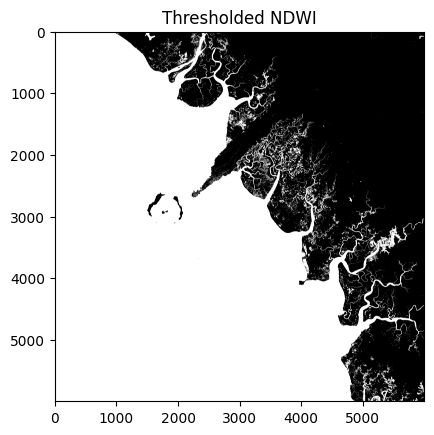

In [ ]:
ndwi = calculate_ndwi(img_array_resized)
threshold = 0.05
thresholded = ndwi < threshold

plt.imshow(thresholded, cmap='gray')
plt.title('Thresholded NDWI')

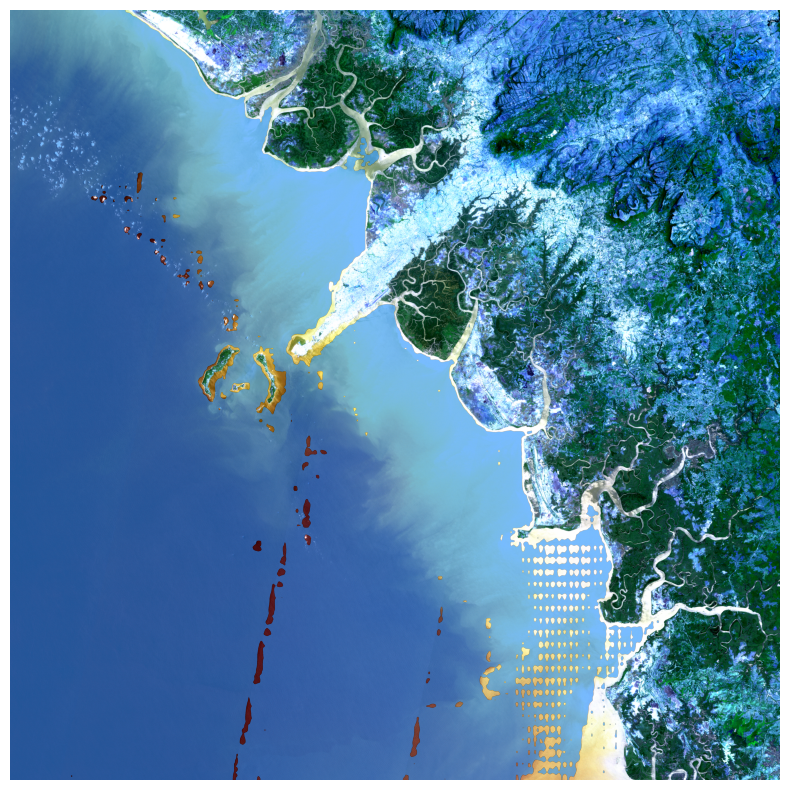

In [ ]:
mask = masks[2]

plt.figure(figsize=(10,10))
plt.imshow(rgb_array_resized)
show_mask(mask, plt.gca())
plt.axis('off')
plt.show()

In [ ]:
crop_data = predict_all_masks(img_array, predictor, crop_size=2000, window_size=300)

## B- Save for every S2 Scenes 

In [31]:
list = [1,5,6,7,8,9,10,11,12,13,15,16]
import tqdm
os.makedirs('../masks', exist_ok=True)

for n_image in tqdm.tqdm(list):
    checkpoint_path = '../checkpoint/sam_vit_h_4b8939.pth'
    sat_dir = '../part1/' + str(n_image) 
    path_image = 'sentinel12_s2_' + str(n_image) +'_img.tif'
    path_mask = 'sentinel12_s2_' + str(n_image) +'_msk.tif'
    img = read_rasterio(os.path.join(sat_dir, path_image))
    img_array = img.read()
    img_array = np.moveaxis(img_array, 0, -1)
    resized = cv2.resize(img_array, (6000, 6000))
    

    # plot image to see what it looks like
    rgb_channel = resized[:,:,0:3]
    rgb_channel =  simple_equalization_8bit(rgb_channel, percentiles=10)

    gt = read_rasterio(os.path.join(sat_dir, path_mask))
    gt_array = gt.read()[0]
    print(gt_array.shape)
    gt_resized = cv2.resize(gt_array, (6000, 6000))
    # save mask rajouter une dim 1
    
    gt_resized = gt_resized.astype(np.uint8)
    print(gt_resized.shape)
    save_tif_image(f'../masks/gt_{n_image}.tif', gt_resized)
    # save image in numpy
    np.save(f'../masks/img_{n_image}.npy', resized)
    if n_image == 9:
        plt.figure(figsize=(10,10))
        plt.imshow(rgb_channel)
        plt.axis('off')
        plt.show()
        plt.close()    
    masks, scores, points_labels, logits = predict_mask(resized, predictor,window_size=600)
    points = [point for point, label in points_labels]
    labels = [label for point, label in points_labels]
    
    # Predict masks
    input_point = np.array(points)
    input_label = np.array(labels)
    mask1 = masks[0]
    mask2 = masks[1]
    
    # save mask 1 and mask 2
    print("save mask 1 and mask 2")
    save_tif_image(f'../masks/mask1_{n_image}.tif', masks[0])
    save_tif_image(f'../masks/mask2_{n_image}.tif', masks[1])
    if n_image == 9:
        plt.figure(figsize=(10,10))
        plt.imshow(rgb_channel)
        show_points(input_point, input_label, plt.gca())
        # save fig 
        plt.savefig(f'../masks/points_{n_image}.png')
        plt.show()
        plt.close()    

  0%|          | 0/12 [00:00<?, ?it/s]

(10980, 10980)
(6000, 6000)


  8%|▊         | 1/12 [00:33<06:04, 33.14s/it]

save mask 1 and mask 2
(10980, 10980)
(6000, 6000)


 17%|█▋        | 2/12 [01:04<05:22, 32.23s/it]

save mask 1 and mask 2
(10980, 10980)
(6000, 6000)


 17%|█▋        | 2/12 [01:30<07:33, 45.32s/it]


KeyboardInterrupt: 